(140, 157, 3)


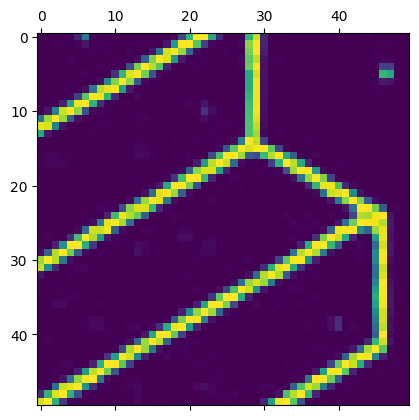

In [76]:
import numpy as np

from skimage.transform import hough_line, hough_line_peaks
from skimage.feature import canny
from skimage.draw import line as draw_line
from skimage import data
import cv2
import matplotlib.pyplot as plt
from matplotlib import cm
from skimage.transform import probabilistic_hough_line
import random 

# Load image"
# image_path = "/Users/nshelton/Pictures/gundam_title.png"
# image_path = "/Users/nshelton/Pictures/akira.jpeg"
# image_path = "/Users/nshelton/Pictures/amplifier_schematic.png"
image_path = "/Users/nshelton/Pictures/plot_raster/stairs.png"

image = cv2.imread(image_path)
print(image.shape)

# image[:,:,1] = image[:,:,0]
# image[:,:,2] = image[:,:,0]

image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# image_gray = cv2.resize(image_gray, (-1,-1), fx = 2, fy = 2)
# _ , filtered =  cv2.threshold(image_gray, 150, 505, cv2.THRESH_BINARY_INV)

filtered = image_gray


# sigma = 2
# min_canny = 2
# max_canny = 100
# filtered = canny(image_gray, sigma, min_canny, max_canny).astype(np.uint8) * 255

filtered = 255 - filtered

filtered = filtered[50:100, 100:150]

# filtered = filtered[950:1000, 1150:1200]
cv2.imwrite("filtered.png", filtered)



plt.matshow(filtered)


In [77]:

erode_stack = filtered.copy()
erode_stack = cv2.blur(erode_stack, (3,3))

# plt.matshow(erode_stack, cmap="turbo")

erode_stack = cv2.adaptiveThreshold(erode_stack, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,  cv2.THRESH_BINARY, 201, -10)

kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))

distance_field = []
for i in range(10) : 
    if erode_stack.sum() == 0 : break
    erode_stack = cv2.erode(erode_stack, kernel)
    distance_field.append(erode_stack)

distance_field =  (np.array(distance_field) > 0).sum(axis=0).astype(np.float32)

# plt.matshow(distance_field, cmap="turbo")

scale = 1
delta = 0
ddepth = cv2.CV_16S

grad_x = cv2.Sobel(distance_field, ddepth, 1, 0, ksize=1, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT).astype(np.float32)
grad_y = cv2.Sobel(distance_field, ddepth, 0, 1, ksize=1, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT).astype(np.float32)



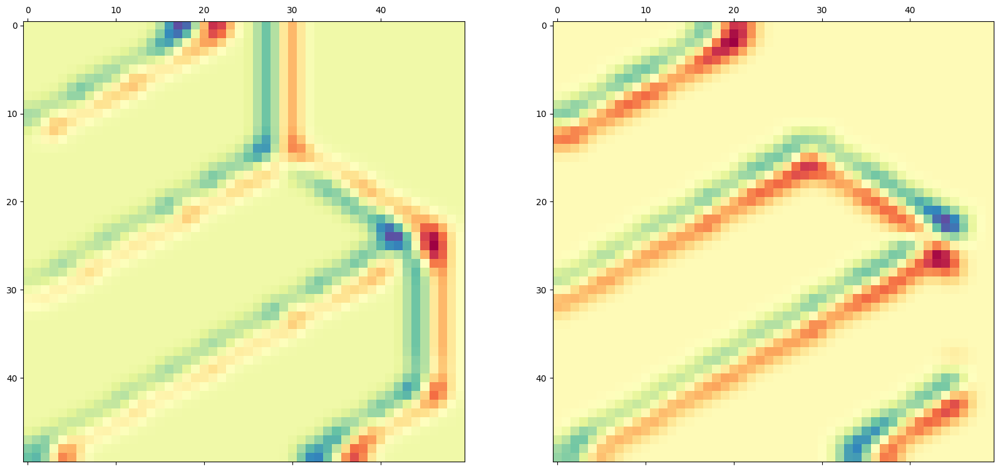

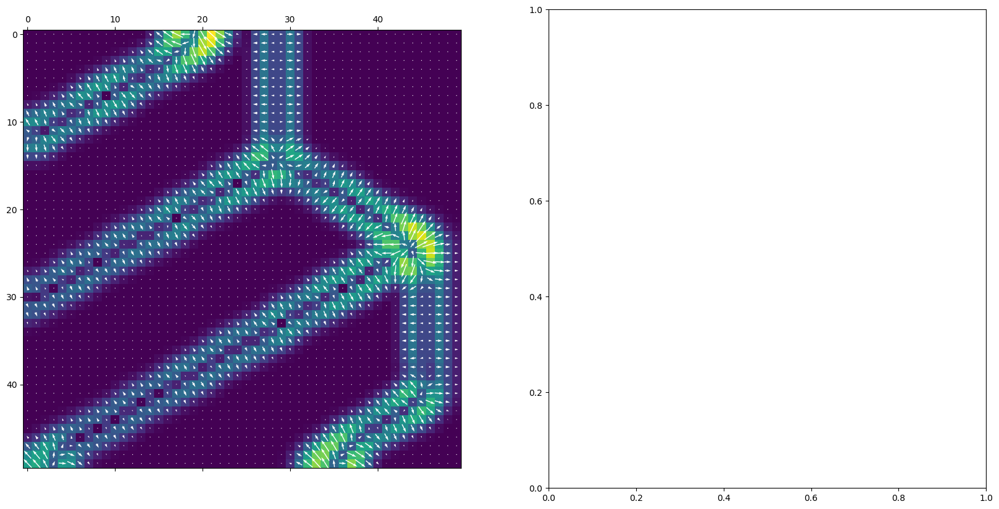

In [92]:
flow_field = np.dstack([grad_x, grad_y])

for _ in range(2):
    flow_field = cv2.GaussianBlur(flow_field, (3,3), 0)
# flow_field = cv2.GaussianBlur(flow_field, (3,3), 0)
# flow_field = cv2.GaussianBlur(flow_field, (3,3), 0)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.matshow(flow_field[:,:,0], cmap="Spectral")
ax2.matshow(flow_field[:,:,1],  cmap="Spectral")

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))

X, Y = np.meshgrid(range(grad_x.shape[1]), range(grad_x.shape[0]))

mag = np.linalg.norm(flow_field, axis = 2)
angles = np.arctan2(flow_field[:,:,0], flow_field[:,:,1])

angles = angles + np.pi/2

flow_field[:,:,0] = np.cos(angles) * mag
flow_field[:,:,1] = np.sin(angles) * mag
flow_field = cv2.GaussianBlur(flow_field, (3,3), 0)

ax1.matshow(mag)
ax1.quiver(X,Y, flow_field[:,:,0], flow_field[:,:,1], color="white", pivot="mid", width = 0.002, scale =30)

 

(50, 50, 2)


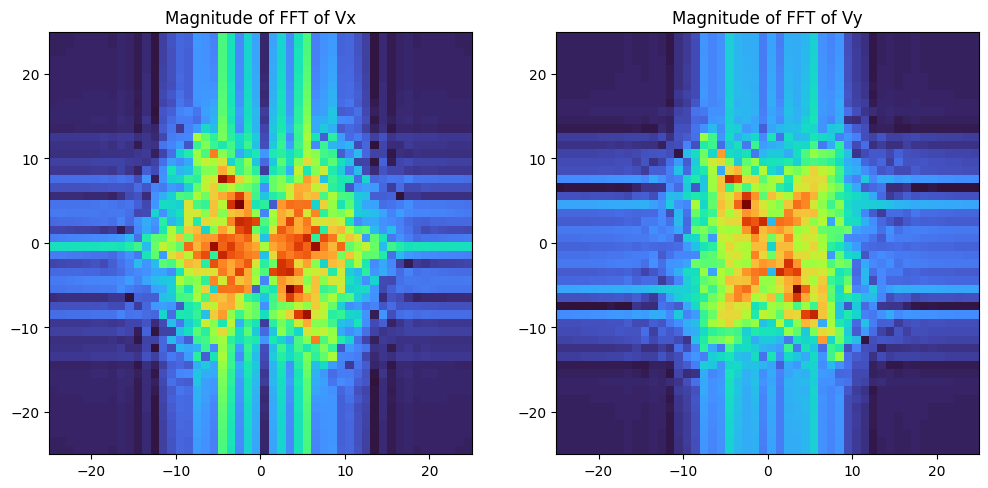

In [96]:

import numpy as np
import matplotlib.pyplot as plt

V = np.stack((flow_field[:,:,0], flow_field[:,:,1]), axis=-1)

print(V.shape)
Vx_fft = np.fft.fft2(V[..., 0])
Vy_fft = np.fft.fft2(V[..., 1])

# Combine them into a single array if needed
Vx_magnitude = np.abs(Vx_fft)
Vy_magnitude = np.abs(Vy_fft)

# Optional: Normalize or threshold the magnitude for better visibility
Vx_magnitude = np.log1p(Vx_magnitude)
Vy_magnitude = np.log1p(Vy_magnitude)
# Visualize the magnitude spectra
plt.figure(figsize=(12, 6))
m,n,_= V.shape

plt.subplot(1, 2, 1)
plt.title('Magnitude of FFT of Vx')
plt.imshow(np.fft.fftshift(Vx_magnitude), cmap='turbo', extent=[-n//2, n//2, -m//2, m//2])

plt.subplot(1, 2, 2)
plt.title('Magnitude of FFT of Vy')
plt.imshow(np.fft.fftshift(Vy_magnitude), cmap='turbo', extent=[-n//2, n//2, -m//2, m//2])

plt.show()

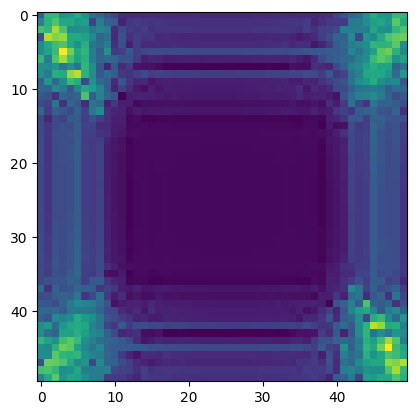

In [94]:
plt.imshow(Vy_magnitude)

Maximum magnitude in Vx: 98.38734346399139 at position (5, 3)
Maximum magnitude in Vy: 167.08072791725195 at position (5, 3)


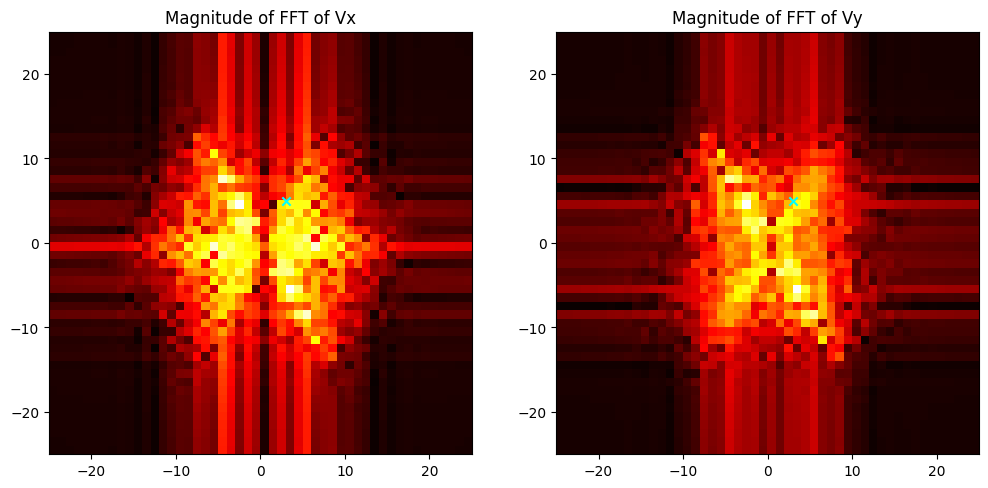

In [97]:
import numpy as np
import matplotlib.pyplot as plt

# Compute FFT of each component
Vx_fft = np.fft.fft2(V[..., 0])
Vy_fft = np.fft.fft2(V[..., 1])

# Compute magnitude
Vx_magnitude = np.abs(Vx_fft)
Vy_magnitude = np.abs(Vy_fft)

# Find the maximum magnitude and its position for Vx
Vx_max_magnitude = np.max(Vx_magnitude)
Vx_max_position = np.unravel_index(np.argmax(Vx_magnitude), Vx_magnitude.shape)

# Find the maximum magnitude and its position for Vy
Vy_max_magnitude = np.max(Vy_magnitude)
Vy_max_position = np.unravel_index(np.argmax(Vy_magnitude), Vy_magnitude.shape)

# Print results
print(f"Maximum magnitude in Vx: {Vx_max_magnitude} at position {Vx_max_position}")
print(f"Maximum magnitude in Vy: {Vy_max_magnitude} at position {Vy_max_position}")

# Optional: Visualize the magnitude spectra with the max points marked
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.title('Magnitude of FFT of Vx')
plt.imshow(np.fft.fftshift(np.log1p(Vx_magnitude)), cmap='hot', extent=[-n//2, n//2, -m//2, m//2])
plt.scatter(*np.fft.fftshift(Vx_max_position), color='cyan', marker='x')

plt.subplot(1, 2, 2)
plt.title('Magnitude of FFT of Vy')
plt.imshow(np.fft.fftshift(np.log1p(Vy_magnitude)), cmap='hot', extent=[-n//2, n//2, -m//2, m//2])
plt.scatter(*np.fft.fftshift(Vy_max_position), color='cyan', marker='x')

plt.show()


Vx singularity corresponding spatial wavelength: (-2.5, -2.272727272727273)
Vy singularity corresponding spatial wavelength: (-2.5, -2.272727272727273)


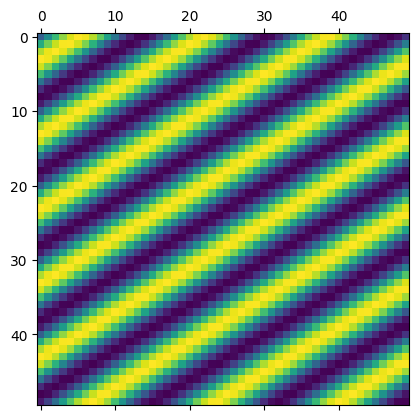

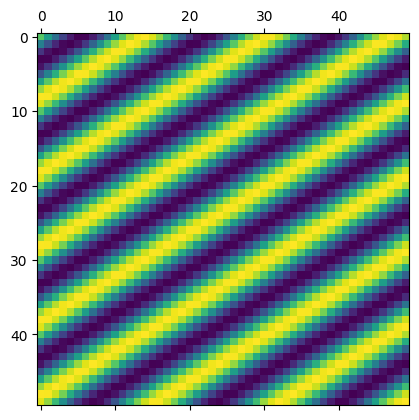

In [100]:
import numpy as np

# Assuming Vx_magnitude and Vy_magnitude from the previous steps
# Also assuming Vx_max_position and Vy_max_position are known

# Shift the FFT results to center the zero frequency
Vx_max_position_shifted = np.array(Vx_max_position) - np.array([Vx_magnitude.shape[0] // 2, Vx_magnitude.shape[1] // 2])
Vy_max_position_shifted = np.array(Vy_max_position) - np.array([Vy_magnitude.shape[0] // 2, Vy_magnitude.shape[1] // 2])

# Calculate the corresponding spatial frequencies
Vx_freq_x = Vx_max_position_shifted[0] / Vx_magnitude.shape[0]
Vx_freq_y = Vx_max_position_shifted[1] / Vx_magnitude.shape[1]

Vy_freq_x = Vy_max_position_shifted[0] / Vy_magnitude.shape[0]
Vy_freq_y = Vy_max_position_shifted[1] / Vy_magnitude.shape[1]

# Determine the spatial wavelength (inverse of frequency)
Vx_wavelength_x = 1 / Vx_freq_x if Vx_freq_x != 0 else float('inf')
Vx_wavelength_y = 1 / Vx_freq_y if Vx_freq_y != 0 else float('inf')

Vy_wavelength_x = 1 / Vy_freq_x if Vy_freq_x != 0 else float('inf')
Vy_wavelength_y = 1 / Vy_freq_y if Vy_freq_y != 0 else float('inf')

print(f"Vx singularity corresponding spatial wavelength: ({Vx_wavelength_x}, {Vx_wavelength_y})")
print(f"Vy singularity corresponding spatial wavelength: ({Vy_wavelength_x}, {Vy_wavelength_y})")

# Optionally, apply an inverse FFT to visualize in spatial domain
Vx_fft_masked = np.zeros_like(Vx_fft)
Vy_fft_masked = np.zeros_like(Vy_fft)

# Place the maximum back into the original position
Vx_fft_masked[Vx_max_position] = Vx_fft[Vx_max_position]
Vy_fft_masked[Vy_max_position] = Vy_fft[Vy_max_position]

# Inverse FFT to get the spatial domain impact of the singularities
Vx_singularity = np.fft.ifft2(Vx_fft_masked).real
Vy_singularity = np.fft.ifft2(Vy_fft_masked).real

# Now Vx_singularity and Vy_singularity show the position of the singularity in the original spatial domain
plt.matshow(Vx_singularity)
plt.matshow(Vy_singularity)

In [69]:



if Vf.shape[0]!=3: print('Not a 3D field in required form!')

NX, NY = Vf.shape[1:]

Vfx = Vf[0]
Vfy = Vf[1]

vx_f = np.fft.fftn(Vfx)
vy_f = np.fft.fftn(Vfy)

kx = np.fft.fftfreq(NX).reshape(NX,1,1)
ky = np.fft.fftfreq(NY).reshape(NY,1)
k2 = kx**2 + ky**2 
k2[0,0] = 1. # to avoid inf. we do not care about the k=0 component

div_Vf_f = (vx_f * kx +  vy_f * ky ) #* 1j
V_compressive_overk = div_Vf_f / k2
V_compressive_x = np.fft.ifftn(V_compressive_overk * kx) #[:,np.newaxis,np.newaxis])
V_compressive_y = np.fft.ifftn(V_compressive_overk * ky)

V_solenoidal_x = Vfx - V_compressive_x
V_solenoidal_y = Vfy - V_compressive_y

# check if the solenoidal part really divergence-free
divVs = np.fft.ifftn((np.fft.fftn(V_solenoidal_x) * kx + np.fft.fftn(V_solenoidal_y) * ky ) * 1j * 2. * np.pi)

print('div_solenoidal max:', abs(divVs).max())

# check the power in solenoidal and compressive components
print('variance:')
print('solenoidal x,y,z:', V_solenoidal_x.var(), V_solenoidal_y.var(),)
print('compressive x,y,z:', V_compressive_x.var(), V_compressive_y.var())

# plot one slice of the decomposed field on X-Y plane
X, Y = np.meshgrid(range(NY), range(NX))
plt.figure()
plt.quiver(X, Y, V_solenoidal_x[:,:,0], V_solenoidal_y[:,:,0])
plt.figure()
plt.quiver(X, Y, V_compressive_x[:,:,0], V_compressive_y[:,:,0])
plt.ion()
plt.show()

ValueError: operands could not be broadcast together with shapes (150,100) (100,1) 

[[ 0.      -0.00229 -0.00456 ... -0.      -0.       0.     ]
 [ 0.0013  -0.00108 -0.00333 ...  0.       0.       0.     ]
 [ 0.00277  0.0001  -0.00226 ...  0.00001  0.00001  0.00001]
 ...
 [ 0.03386  0.02012  0.00681 ... -0.0054   0.00283  0.00931]
 [ 0.03658  0.04422  0.02588 ... -0.00871 -0.0018   0.0043 ]
 [-0.00008  0.05442  0.06732 ... -0.01214 -0.00589  0.     ]]
[[ 0.      -0.00229 -0.00456 ... -0.      -0.       0.     ]
 [ 0.0013  -0.00108 -0.00333 ...  0.       0.       0.     ]
 [ 0.00277  0.0001  -0.00226 ...  0.00001  0.00001  0.00001]
 ...
 [ 0.03386  0.02012  0.00681 ... -0.0054   0.00283  0.00931]
 [ 0.03658  0.04422  0.02588 ... -0.00871 -0.0018   0.0043 ]
 [-0.00008  0.05442  0.06732 ... -0.01214 -0.00589  0.     ]]
-0.10859103895051907 0.14682579025622886


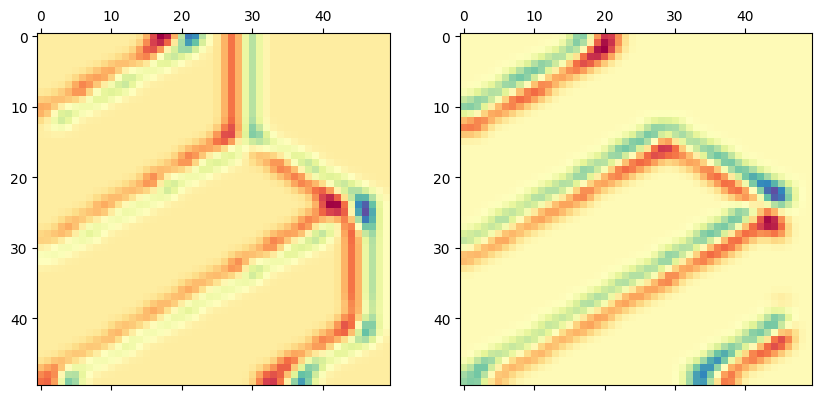

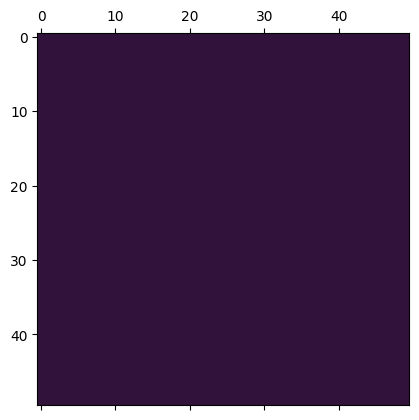

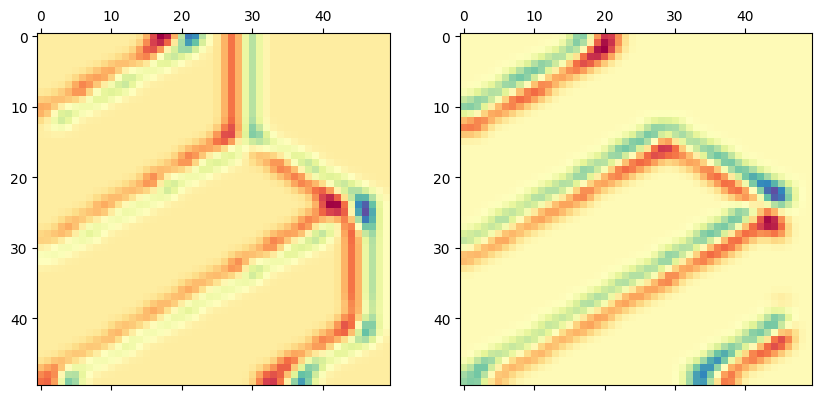

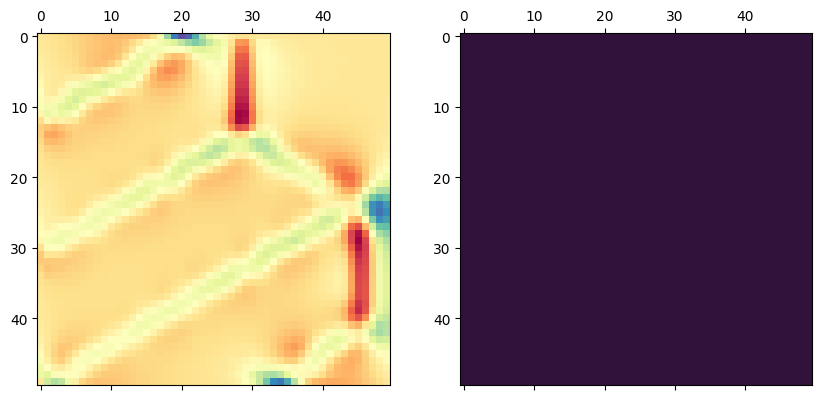

In [10]:
import numpy as np

def solve_navier_stokes(velocity_field, pressure_field, density, viscosity, dt, dx, dy, steps):
    """
    Solve the 2D incompressible Navier-Stokes equations using Euler iterations.
    
    Parameters:
    - velocity_field: A 3D numpy array of shape (n, m, 2) representing the initial velocity field.
    - pressure_field: A 2D numpy array of shape (n, m) representing the initial pressure field.
    - density: The density of the fluid.
    - viscosity: The kinematic viscosity of the fluid.
    - dt: The time step.
    - dx: The grid spacing in the x direction.
    - dy: The grid spacing in the y direction.
    - steps: The number of time steps to iterate.
    
    Returns:
    - Updated velocity and pressure fields after the specified number of steps.
    """
    n, m, _ = velocity_field.shape
    
    u = velocity_field[:, :, 0]
    v = velocity_field[:, :, 1]
    
    for _ in range(steps):
        # Compute the derivatives of velocity components
        du_dx = np.gradient(u, dx, axis=1)
        du_dy = np.gradient(u, dy, axis=0)
        dv_dx = np.gradient(v, dx, axis=1)
        dv_dy = np.gradient(v, dy, axis=0)
        
        # Compute the Laplacian of velocity components
        laplacian_u = np.gradient(du_dx, dx, axis=1) + np.gradient(du_dy, dy, axis=0)
        laplacian_v = np.gradient(dv_dx, dx, axis=1) + np.gradient(dv_dy, dy, axis=0)
        
        # Compute the non-linear advection terms
        advection_u = u * du_dx + v * du_dy
        advection_v = u * dv_dx + v * dv_dy
        
        # Compute the pressure gradient
        dp_dx = np.gradient(pressure_field, dx, axis=1)
        dp_dy = np.gradient(pressure_field, dy, axis=0)
        
        # Update the velocity field using the Euler method
        u = u + dt * (-advection_u - (1/density) * dp_dx + viscosity * laplacian_u)
        v = v + dt * (-advection_v - (1/density) * dp_dy + viscosity * laplacian_v)
        
        # Solve for pressure using the incompressibility condition
        div_u = du_dx + dv_dy
        pressure_field = pressure_field - dt * density * div_u
        
        # Apply boundary conditions (e.g., no-slip condition)
        u[0, :] = u[-1, :] = u[:, 0] = u[:, -1] = 0
        v[0, :] = v[-1, :] = v[:, 0] = v[:, -1] = 0
    
    # Update the velocity field
    velocity_field[:, :, 0] = u
    velocity_field[:, :, 1] = v
    
    return velocity_field, pressure_field

# Example usage
viscosity = 11                       # Kinematic viscosity
dt = 0.01                             # Time step
dx = 1.0                              # Grid spacing in x direction
dy = 1.0                              # Grid spacing in y direction
steps = 100                          # Number of time steps

pressure_field = np.zeros(flow_field[:,:,0].shape)
velocity_field = flow_field.copy()
densityfield = np.ones(pressure_field.shape) # distance_field.astype(np.float32) + 0.01

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.matshow(flow_field[:,:,0], cmap = "Spectral")
ax2.matshow(flow_field[:,:,1], cmap = "Spectral")

densityfield = cv2.GaussianBlur(densityfield, (3,3), 0)
plt.matshow(densityfield, cmap = "turbo")

velocity_field, pressure_field = solve_navier_stokes(velocity_field, pressure_field, densityfield, viscosity, dt, dx, dy, steps)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.matshow(flow_field[:,:,0], cmap = "Spectral")
ax2.matshow(flow_field[:,:,1], cmap = "Spectral")

np.set_printoptions(suppress=True, precision=5)
print(pressure_field)
# pressure_field = np.log(pressure_field + 0.001)


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.matshow(pressure_field, cmap = "Spectral")
ax2.matshow(densityfield, cmap = "turbo")


print(pressure_field)
print(pressure_field.min(), pressure_field.max())


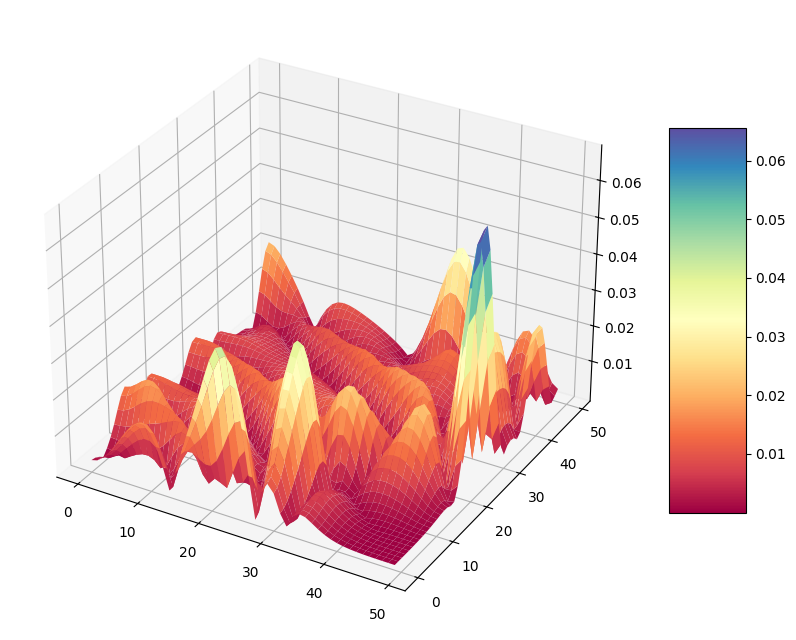

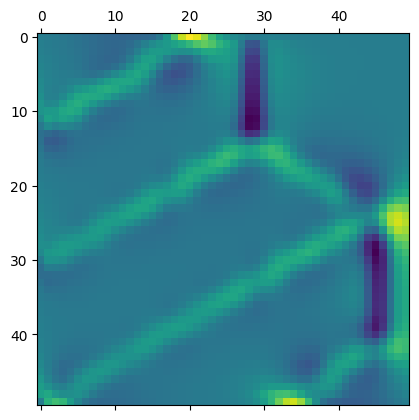

In [12]:
import matplotlib.pyplot as plt
import numpy as np

from matplotlib import cm
from matplotlib.ticker import LinearLocator


def plot_heightmap(mat):
    fig, ax = plt.subplots(subplot_kw={"projection": "3d"}, figsize=(10,10))

    # Make data.
    X, Y = np.meshgrid(range(mat.shape[0]), range(mat.shape[1]))

    # Plot the surface.
    surf = ax.plot_surface(X, Y, mat, cmap="Spectral", linewidth=0, antialiased=True)

    # Customize the z axis.
    # ax.set_zlim(-1.01, 1.01)
    # ax.zaxis.set_major_locator(LinearLocator(10))
    # ax.zaxis.set_major_formatter('{x:.02f}')

    # Add a color bar which maps values to colors.
    fig.colorbar(surf, shrink=0.5, aspect=5)
    plt.show()

result = pressure_field.copy()
for i in range(10):
    result = cv2.GaussianBlur(result, (3,3), 0)

plot_heightmap(np.abs(result))
plt.matshow(pressure_field)

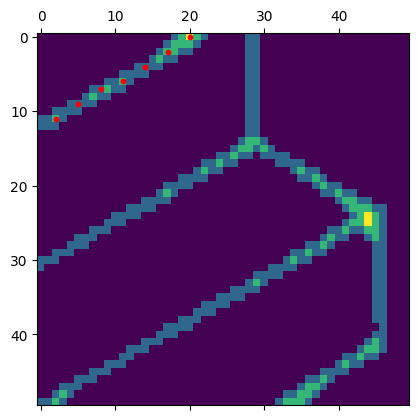

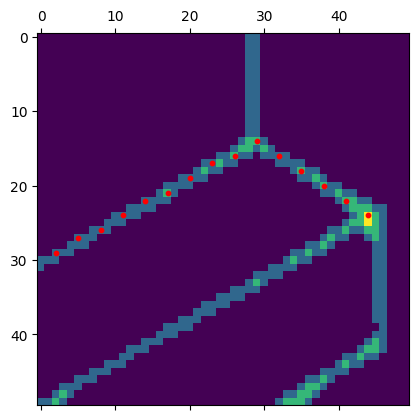

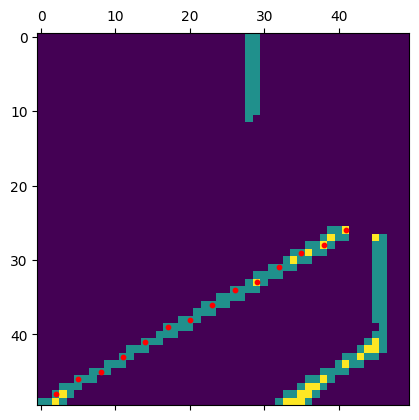

In [ ]:

field = distance_field.copy()

def lookupxy(raster, xy):
    if int(xy[1]) >= 0 and int(xy[1]) < raster.shape[0] and int(xy[0]) >= 0 and int(xy[0]) < raster.shape[1]:
        return raster[int(xy[1]), int(xy[0])]
    return np.nan


def maxLoc(img):
    _, _, _, max_loc = cv2.minMaxLoc(img)
    return max_loc

def maxNearby(img, pos, r = 5):

    maxval = 0
    maxpos = [0,0]

    for dx in np.arange(-r, r, 1):
        for dy in np.arange(-r, r, 1):
            if 0 <= pos[1] + dy < img.shape[0] and 0 <= pos[0] + dx < img.shape[1]:
                value = img[pos[1] + dy, pos[0] + dx]
                if value > maxval:
                    maxpos = pos + np.array([dx,dy])
                    maxval = value

    return maxpos

for j in range(3):
    pos = maxLoc(field)
    plt.matshow(field)

    for i in range(100):

        plt.scatter(pos[0], pos[1], s = 10, c="red")
        cv2.circle(field, pos, 3, 0, -1)
        pos = maxNearby(field, pos, 3)

        val = field[pos[1], pos[0]]
        if val == 0: break

array([-4, -3, -2, -1,  0,  1,  2,  3])

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


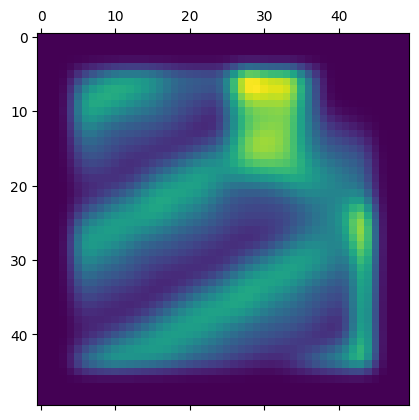

In [ ]:
variance = np.zeros((flow_field.shape[0], flow_field.shape[1]))
window = 5
for row in range(window, flow_field.shape[0]-window):
    for col in range(window, flow_field.shape[1]-window):
        flow_window = flow_field[row-window:row+window, col-window:col+window, :]
        angles = np.arctan2(flow_window[:,:,0], flow_window[:,:,1])
        variance[row, col] = np.var(angles)

print(variance)
variance = cv2.GaussianBlur(variance, (5,5), 0)
plt.matshow(variance)


86028
start [44. 24.]
[44. 24.] 255


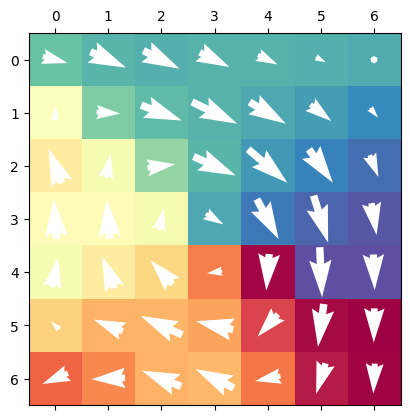

flow [ 0.09 -0.19] @ [44. 24.]
[44.87 22.2 ] 113
start [44. 24.]
[44. 24.] 255


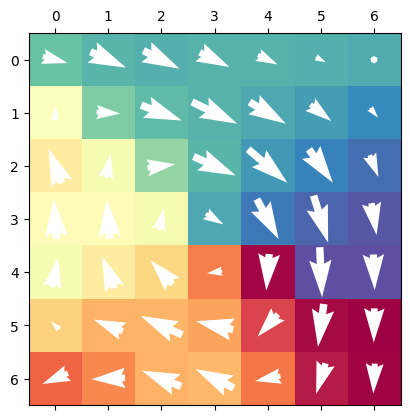

flow [ 0.09 -0.19] @ [44. 24.]
[44.87 22.2 ] 113
[]


True

In [ ]:
from pathUtils import *

np.set_printoptions(suppress=True, precision = 2)

def rasterStroke(dims, path, line_thickness):
        img = np.zeros(dims, np.uint8)
        if (len(path)) == 1:
            cv2.circle(
                img, (round(path[0][0]), round(path[0][1])), line_thickness, 1, -1
            )
        for i in range(len(path) - 1):
            a = (round(path[i][0]), round(path[i][1]))
            b = (round(path[i + 1][0]), round(path[i + 1][1]))
            cv2.line(img, a, b, 1, line_thickness, cv2.LINE_AA)
        return img

def lookupxy(raster, xy):
    if int(xy[1]) >= 0 and int(xy[1]) < raster.shape[0] and int(xy[0]) >= 0 and int(xy[0]) < raster.shape[1]:
        return raster[int(xy[1]), int(xy[0])]
    return np.nan

def maxLoc(img):
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(img)
    return max_loc

def place_path(raster, pos, thickness = 1) : 
    Greedy = False
    print("start", pos)
        
    img = raster.copy()
    path = []
    window = thickness
    circleSize = thickness

    avg_val = lookupxy(img, pos)

    flow =  lookupxy(flow_field, pos)
    flow_angle = np.arctan2(flow[0], flow[1])
    avg_angle = flow_angle
    # avg_angle = np.nan
    while len(path) < 100:
        val = lookupxy(img, pos)
        print(pos, val)
        
        if int(pos[1]) < 0 or int(pos[1]) >= img.shape[0] or int(pos[0]) < 0 or int(pos[0]) >= img.shape[1]: break

        if val < 0.8 * avg_val :break

        avg_val = 0.9 * avg_val + 0.1 * val
        path.append(pos.copy())

        if Greedy:
            cv2.circle(img, pos.astype(np.int32), int(circleSize), 0, -1 )
        
        if(Greedy) :
            max_loc = maxLoc(
                img[
                    int(pos[1]) - window : int(pos[1]) + window + 1,
                    int(pos[0]) - window : int(pos[0]) + window + 1,
                ]
            )

            delta = np.array(max_loc) - window

        else :
            flow =  lookupxy(flow_field, pos)
            flow_window = flow_field[
                int(pos[1]) - window : int(pos[1]) + window + 1,
                int(pos[0]) - window : int(pos[0]) + window + 1,
            ]

            # plt.matshow(np.linalg.norm(flow_window, axis = 2))
            plt.matshow(np.arctan2(flow_window[:,:,0], flow_window[:,:,1]), cmap="Spectral")

            X, Y = np.meshgrid(range(flow_window.shape[1]), range(flow_window.shape[0]))
            plt.quiver(X,Y, flow_window[:,:,0], flow_window[:,:,1], color="white", pivot="mid", width = 0.02, scale = 10)
            plt.show()

            flow = np.array([flow_window[:,:,0].mean(), flow_window[:,:,1].mean()])


            print("flow", flow, "@", pos)
            if np.linalg.norm(flow) < 0.1:
                print("no flow")
                continue
            delta = flow / np.linalg.norm(flow) * 2


        angle = np.arctan2(delta[0], delta[1])

        if avg_angle == np.nan:
            avg_angle = angle

        avg_angle = avg_angle * 0.5 + angle * 0.5

        if (abs(angle - avg_angle) > np.pi / 6):
            break

        pos += delta

    return path


img = filtered.copy()

# img = img[500:1000, :500]
img = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,  cv2.THRESH_BINARY, 201, -70)
img = cv2.blur(img, (3,3))
cv2.imwrite("filtered.png", img)

paths = []
print(img.sum())

# while img.sum() > 100:
for i in range(2):
    print(img.sum(), "\t", len(paths), end="\t\t\t\r")

    pos = np.array(maxLoc(img), np.float32)
    path = place_path(img, pos, thickness=3)

    if len(path) < 2:
        continue
    paths.append(path)

    this_stroke = rasterStroke(img.shape, path, line_thickness = 4)
    img = np.clip(img.astype(np.float32) - this_stroke.astype(np.float32) * 255, 0, 255).astype(np.uint8)
    
    cv2.imwrite("remaining_ink.png", img)

print(paths)
path_list = [[p for p in path] for path in paths if len(path) > 1]
RENDER_SCALE = 0.5
render_img = plotPaths(path_list, RENDER_SCALE)
cv2.imwrite("render.png", render_img)



In [ ]:


from tqdm import tqdm 
path_list = [[p for p in path] for path in paths if len(path) > 1]

print(len(paths))
print(len(path_list))

merge_threshold = 2

for i in tqdm(range(len(path_list))):
    len_before = len(path_list)
    path_list = merge_one_path_kd(path_list, merge_threshold)
    if len_before == len(path_list):
        break

def getPathLength(path):
    length = 0
    for i in range(len(path) - 1):
        length += np.linalg.norm(path[i] - path[i+1])
    return length

path_list = close_loops(path_list, threshold=5)
path_list  = [np.array(path) for path in path_list]

path_list = [path for path in path_list if getPathLength(path) > 2]
path_list = smooth_all_2(path_list, 0.01)
path_list = simplify_all(path_list, 0.001)
path_list = smooth_all_2(path_list, 0.1)
path_list = simplify_all(path_list, 0.1)

RENDER_SCALE = 0.5
render_img = plotPaths(path_list, RENDER_SCALE)
cv2.imwrite("render.png", render_img)

8
8


  0%|          | 0/8 [00:00<?, ?it/s]


True

In [ ]:
path_list = smooth_all_2(path_list, 0.1)
RENDER_SCALE = 0.5
render_img = plotPaths(path_list, RENDER_SCALE)
cv2.imwrite("render.png", render_img)

True

In [ ]:
import json
import uuid

projects_folder = "/Users/nshelton/Hephaestus/projects"

def writePlot(paths):
    dictionary = {
        "created_time": "4/7/2024 4:42:27 PM",
        "modified_time": "4/7/2024 6:27:36 PM",
        "camera_position": [100, 100],
        "zoom": 10.702,
        "aspect": 0.563,
        "dom_element": {},
        "plot_models": [],
    }

    dictionary["plot_models"].append(
        {
            "position": {"x": 0, "y": 0},
            "paths": [path.tolist() for path in path_list],
            "scale": 0.1,
            "id": str(uuid.uuid4()),
            "state": "none",
        }
    )


    with open(projects_folder + "/circuit2.json", "w") as outfile:
        json.dump(dictionary, outfile)

writePlot(path_list)


In [ ]:
# def lookupxy(raster, xy):
#     if int(xy[1]) > 0 and int(xy[1]) < raster.shape[0] and  int(xy[0]) > 0 and int(xy[0]) < raster.shape[1]:
#         return raster[int(xy[1]), int(xy[0])]
#     return np.nan

# from pathUtils import * 

# from scipy.spatial import KDTree

# points.shape

# paths = []
# visited = np.zeros(values.shape)

# start_idx = int(random.random()* 1000)
# print(start_idx, values[start_idx], points[start_idx])

# path = []
# current_idx = start_idx

# for i in range(1000):
#     tree = KDTree(points[visited == 0])
#     pos = points[current_idx]
#     path.append(pos)
#     visited[current_idx] = 1

#     flow = lookupxy(flow_field, pos)
#     magnitude = np.linalg.norm(flow)
#     print(pos, flow)
#     if (np.isnan(magnitude)):
#         break

#     query_point = pos + flow
#     distance, idx = tree.query(query_point, k=2)

#     if (distance[1] > 10) : 
#         break

#     current_idx = idx[1]

# print(len (path))
# paths.append(path)

# path_render = plotPaths(paths, 1)
# cv2.imwrite("render.png", path_render )

In [ ]:
import cv2
import numpy as np

from pathUtils import *

remaining_ink = filtered.copy()
all_strokes_raster = np.ones(remaining_ink.shape) * 255

all_paths = []

while len(all_paths) < 500 and remaining_ink.sum() > 10:

    def lookupxy(raster, xy):
        if int(xy[1]) > 0 and int(xy[1]) < raster.shape[0] and  int(xy[0]) > 0 and int(xy[0]) < raster.shape[1]:
            return raster[int(xy[1]), int(xy[0])]
        return np.nan


    def placeStroke(input_raster, start):
        img = input_raster.copy()
        path = []
        pos = np.array(start)

        window = 2

        max_val = lookupxy(input_raster, pos)

        while max_val > 0:
            min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(
                img[
                    pos[1] - window : pos[1] + window + 1,
                    pos[0] - window : pos[0] + window + 1,
                ]
            )
            pos += np.array(max_loc) - window
            path.append(pos.copy())
            cv2.circle(img, pos, window - 1, 0, -1)

        return path

    def placeStrokeOrthogonalGradient(input_raster, flow_field, start):
        img = input_raster.copy()
        path = []
        pos = np.array(start, np.float32)
        print("start at", pos, lookupxy(img, pos))

        speed = 2
        while (
            int(pos[0]) < img.shape[1] and int(pos[1]) < img.shape[0]
            and lookupxy(img, pos) > 0
        ):
            path.append(pos.copy())
            cv2.circle(img, (round(pos[1]), round(pos[0])), speed , 0, -1)

            flow = lookupxy(flow_field, pos)
            magnitude = np.linalg.norm(flow)
            print("flow", flow, magnitude, pos)
            if magnitude < 0.001:
                break

            delta = speed * flow / magnitude
            print("delta", delta)
            pos += delta
            print("newpos ",pos, img.shape, lookupxy(img, pos))

        return path

    line_thickness = 2

    def rasterStroke(dims, path):
        print(len(path))

        img = np.zeros(dims)

        if (len(path)) == 1:
            cv2.circle(
                img, (round(path[0][0]), round(path[0][1])), line_thickness, 255, -1
            )

        for i in range(len(path) - 1):
            a = (round(path[i][0]), round(path[i][1]))
            b = (round(path[i + 1][0]), round(path[i + 1][1]))
            cv2.line(img, a, b, 255, line_thickness, cv2.LINE_AA)

        return img

    print(remaining_ink.sum(), "\t", len(all_paths), end="\t\t\t\r")
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(remaining_ink)

    # new_stroke = placeStroke(remaining_ink, max_loc)
    new_stroke = placeStrokeOrthogonalGradient(remaining_ink, flow_field, max_loc)



    print("new_stroke", new_stroke)
    all_paths.append(new_stroke)
    stroke_raster = rasterStroke(remaining_ink.shape, new_stroke)
    remaining_ink = np.clip(remaining_ink - stroke_raster, 0, 255)
    all_strokes_raster = np.clip(
        all_strokes_raster.astype(np.int32) - stroke_raster.astype(np.int32) * 255,
        0,
        255,
    ).astype(np.uint8)

    cv2.imwrite("current_stroke.png", (all_strokes_raster).astype(np.uint8))
    cv2.imwrite("remaining_ink.png", remaining_ink)

# cv2.imwrite("current_stroke.png",  (all_strokes_raster).astype(np.uint8))
path_list = [[p.tolist() for p in path] for path in all_paths if len(path) > 1]

print(len(path_list))

RENDER_SCALE = 0.5
# connect_close_paths(path_list)
render_img = plotPaths(path_list, RENDER_SCALE)
cv2.imwrite("render.png", render_img)

start at [11.  8.] 255
flow [-1  0] 1.0 [11.  8.]
delta [-2.  0.]
newpos  [9. 8.] (140, 157) 11
flow [0 1] 1.0 [9. 8.]
delta [0. 2.]
newpos  [ 9. 10.] (140, 157) 0
new_stroke [array([11.,  8.], dtype=float32), array([9., 8.], dtype=float32)]
2
start at [21.  9.] 255.0
flow [-2  1] 2.23606797749979 [21.  9.]
delta [-1.78885438  0.89442719]
newpos  [19.211145  9.894427] (140, 157) 8.0
flow [-1  1] 1.4142135623730951 [19.211145  9.894427]
delta [-1.41421356  1.41421356]
newpos  [17.796932  11.3086405] (140, 157) 0.0
new_stroke [array([21.,  9.], dtype=float32), array([19.211145,  9.894427], dtype=float32)]
2
start at [23.  9.] 255.0
flow [-1  0] 1.0 [23.  9.]
delta [-2.  0.]
newpos  [21.  9.] (140, 157) 0.0
new_stroke [array([23.,  9.], dtype=float32)]
1
start at [98.  9.] 255.0
flow [0 0] 0.0 [98.  9.]
new_stroke [array([98.,  9.], dtype=float32)]
1
start at [95. 10.] 255.0
flow [ 0 -1] 1.0 [95. 10.]
delta [ 0. -2.]
newpos  [95.  8.] (140, 157) 13.0
flow [-1  1] 1.4142135623730951 [95.  

KeyboardInterrupt: 

In [ ]:
from tqdm import tqdm


import numpy as np
from scipy.spatial import KDTree
 
path_list = [[p.tolist() for p in path] for path in all_paths if len(path) > 1]

print(len(path_list))

merge_threshold = 5

for i in tqdm(range(len(path_list))):
    len_before = len(path_list)
    path_list = merge_one_path_kd(path_list, merge_threshold)
    if len_before == len(path_list):
        break

print("merged to", len(path_list))


path_list = close_loops(path_list)

print("closed loops", len(path_list))

path_list  = [np.array(path) for path in path_list]

for _ in range(1):
    path_list = smooth_all_2(path_list, 0.01)

print("smoothed 1", len(path_list))

path_list = simplify_all(path_list, 0.001)

print("simplify_all 1", len(path_list))

for _ in range(1):
    path_list = smooth_all_2(path_list, 0.1)

print("smoothed 2", len(path_list))

path_list = simplify_all(path_list, 0.1)
print("simplify 2", len(path_list))

RENDER_SCALE = 0.5
# connect_close_paths(path_list)
render_img = plotPaths(path_list, RENDER_SCALE)
cv2.imwrite("render.png", render_img)


import json 
import uuid

projects_folder = "/Users/nshelton/Hephaestus/projects"

def writePlot(paths):
    dictionary = {
        "created_time": "4/7/2024 4:42:27 PM",
        "modified_time": "4/7/2024 6:27:36 PM",
        "camera_position": [100, 100],
        "zoom": 10.702,
        "aspect": 0.563,
        "dom_element": {},
        "plot_models": [],
    }

    dictionary["plot_models"].append(
        {
            "position": {"x": 0, "y": 0},
            "paths": [path.tolist() for path in path_list],
            "scale": 0.03,
            "id": str(uuid.uuid4()),
            "state": "none",
        }
    )


    with open(projects_folder + "/akiraflow.json", "w") as outfile:
        
        json.dump(dictionary, outfile)


writePlot(path_list)